# Tugas Analisis Multimedia: **Image (Citra Digital)**

**Mata Kuliah:** Sistem & Teknologi Multimedia  
**Nama:** Nashwa Putri Laisya  
**NIM:** 122140180  
**GitHub:** https://github.com/nashwals/multimedia

---

## Deskripsi Tugas

Tugas ini bertujuan untuk memahami **representasi dasar data citra digital (image)** melalui praktik langsung memuat data, visualisasi komponen warna, serta melakukan analisis spasial sederhana menggunakan berbagai teknik dasar pengolahan citra.

Anda akan bekerja dengan satu atau beberapa gambar (foto diri, objek, atau lingkungan sekitar) untuk:

* Mengamati struktur data piksel dan channel warna (RGB, Grayscale, HSV, dsb.)
* Menganalisis perbedaan hasil visualisasi antar representasi warna
* Melakukan eksplorasi sederhana terhadap transformasi citra (cropping, filtering, edge detection, dll.)
* Menyimpulkan pengaruh setiap tahap pemrosesan terhadap persepsi visual

Fokus tugas ini adalah pada **pemahaman konsep representasi spasial citra digital** dan **interpretasi hasil visualisasi**, **bukan** pada manipulasi kompleks atau penerapan model pembelajaran mesin.

---

In [1]:
# Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import os
import mediapipe as mp

---

### **Soal 1 — Cropping dan Konversi Warna**

* Ambil sebuah gambar diri Anda (*selfie*) menggunakan kamera atau smartphone.
* Lakukan **cropping secara manual** untuk menghasilkan dua potongan:

  * Cropping **kotak persegi pada area wajah**.
  * Cropping **persegi panjang pada area latar belakang**.
* Resize hasil crop menjadi **920×920 piksel**.
* Konversi gambar menjadi **grayscale** dan **HSV**, lalu tampilkan ketiganya berdampingan.
* Tambahkan **anotasi teks** berisi nama Anda di atas kepala pada gambar hasil crop.

  * Gaya teks (font, warna, posisi, ukuran, ketebalan) **dibebaskan**.
* Jelaskan efek **cropping** dan **perubahan warna** menggunakan **Markdown**.


#### 1.1 Memuat dan Menampilkan Gambar Selfie

Ukuran gambar asli: (3088, 2316, 3)


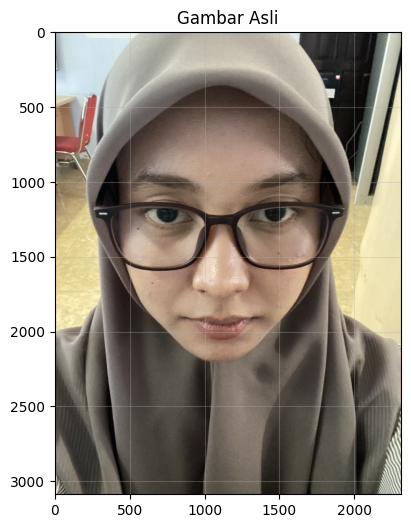

In [2]:
# Memuat gambar selfie
img1_path = os.path.join(os.getcwd(), 'assets_ws4', 'selfie.jpeg')

img1_original = cv2.imread(img1_path)
img1_rgb = cv2.cvtColor(img1_original, cv2.COLOR_BGR2RGB)

print(f"Ukuran gambar asli: {img1_rgb.shape}")

# Menampilkan gambar asli
plt.figure(figsize=(8, 6))
plt.imshow(img1_rgb)
plt.title('Gambar Asli')
plt.axis('on') # Sumbu saya tampilkan agar mudah untuk memilih area crop
plt.grid(True, alpha=0.3)
plt.show()

#### 1.2 Cropping Gambar

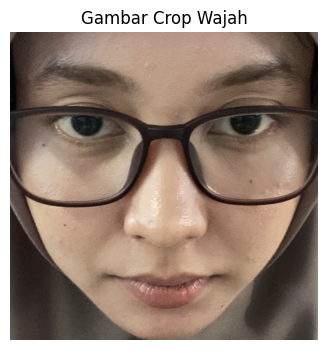

True

In [3]:
# Cropping area wajah secara manual

# Koordinat posisi wajah
face_y1, face_y2 = 800, 2200
face_x1, face_x2 = 400, 1800

img1_face_crop = img1_rgb[face_y1:face_y2, face_x1:face_x2]

# Menampilkan gambar hasil crop wajah
plt.figure(figsize=(4, 4))
plt.imshow(img1_face_crop)
plt.title('Gambar Crop Wajah')
plt.axis('off')
plt.grid(True, alpha=0.3)
plt.show()

# Menyimpan gambar hasil crop wajah
cv2.imwrite('results_ws4/soal1_wajah.png', cv2.cvtColor(img1_face_crop, cv2.COLOR_RGB2BGR))

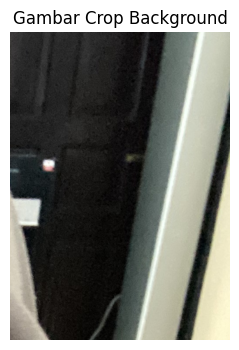

True

In [4]:
# Cropping area background secara manual

# Koordinat area background
bg_y1, bg_y2 = 0, 700
bg_x1, bg_x2 = 1800, 2300

img1_bg_crop = img1_rgb[bg_y1:bg_y2, bg_x1:bg_x2]

# Menampilkan gambar hasil crop background
plt.figure(figsize=(6, 4))
plt.imshow(img1_bg_crop)
plt.title('Gambar Crop Background')
plt.axis('off')
plt.grid(True, alpha=0.3)
plt.show()

# Menyimpan gambar hasil crop background
cv2.imwrite('results_ws4/soal1_background.png', cv2.cvtColor(img1_bg_crop, cv2.COLOR_RGB2BGR))

#### 1.3 Resize Gambar Hasil Crop Menjadi 920x920 piksel

Crop wajah: (1400, 1400, 3) -> Resize: (920, 920, 3)
Crop background: (700, 500, 3) -> Resize: (920, 920, 3)


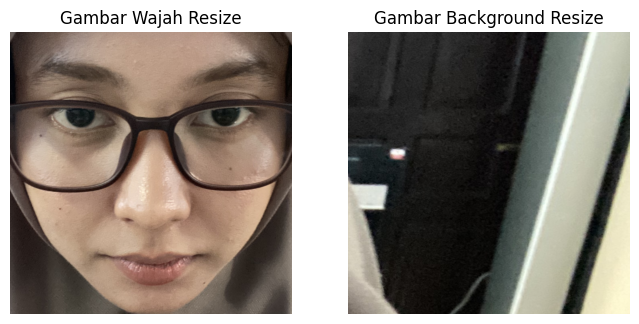

<Figure size 640x480 with 0 Axes>

In [5]:
# Resize gambar crop wajah dan background menjadi 920x920 piksel
target_size = (920, 920)
img1_face_resized = cv2.resize(img1_face_crop, target_size, interpolation=cv2.INTER_AREA)
img1_bg_resized = cv2.resize(img1_bg_crop, target_size, interpolation=cv2.INTER_AREA)

print(f"Crop wajah: {img1_face_crop.shape} -> Resize: {img1_face_resized.shape}")
print(f"Crop background: {img1_bg_crop.shape} -> Resize: {img1_bg_resized.shape}")

# Menampilkan kedua gambar setelah resize
fig, ax = plt.subplots(1, 2, figsize=(8, 6))
ax[0].imshow(img1_face_resized)
ax[0].set_title('Gambar Wajah Resize')
ax[0].axis('off')
ax[1].imshow(img1_bg_resized)
ax[1].set_title('Gambar Background Resize')
ax[1].axis('off')
plt.show()

# Menyimpan plot gambar hasil resize wajah dan background
plt.savefig('results_ws4/soal1_resized_images.png', dpi=150, bbox_inches='tight')

#### 1.4 Konversi Gambar Menjadi Grayscale dan HSV

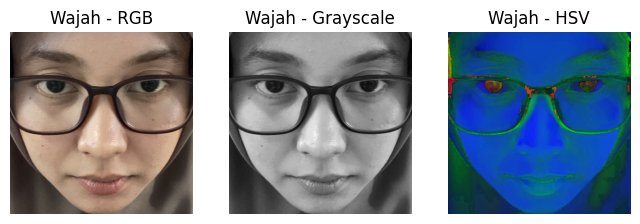

<Figure size 640x480 with 0 Axes>

In [6]:
# Konversi gambar wajah menjadi grayscale dan HSV
face_gray = cv2.cvtColor(img1_face_resized, cv2.COLOR_RGB2GRAY)
face_hsv = cv2.cvtColor(img1_face_resized, cv2.COLOR_RGB2HSV)

# Menampilkan ketiga format gambar untuk wajah
fig, axs = plt.subplots(1, 3, figsize=(8, 4))
axs[0].imshow(img1_face_resized)
axs[0].set_title('Wajah - RGB')
axs[0].axis('off')
axs[1].imshow(face_gray, cmap='gray')
axs[1].set_title('Wajah - Grayscale')
axs[1].axis('off')
axs[2].imshow(face_hsv)
axs[2].set_title('Wajah - HSV')
axs[2].axis('off')
plt.show()

# Menyimpan plot gambar hasil crop wajah dalam tiga format
plt.savefig('results_ws4/soal1_face_formats.png', dpi=150, bbox_inches='tight')

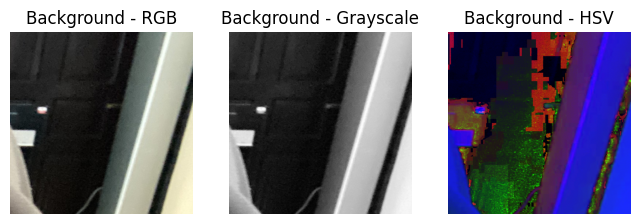

<Figure size 640x480 with 0 Axes>

In [7]:
# Konversi gambar background menjadi grayscale dan HSV
bg_gray = cv2.cvtColor(img1_bg_resized, cv2.COLOR_RGB2GRAY)
bg_hsv = cv2.cvtColor(img1_bg_resized, cv2.COLOR_RGB2HSV)

# Menampilkan ketiga format gambar untuk background
fig, axs = plt.subplots(1, 3, figsize=(8, 4))
axs[0].imshow(img1_bg_resized)
axs[0].set_title('Background - RGB')
axs[0].axis('off')
axs[1].imshow(bg_gray, cmap='gray')
axs[1].set_title('Background - Grayscale')
axs[1].axis('off')
axs[2].imshow(bg_hsv)
axs[2].set_title('Background - HSV')
axs[2].axis('off')
plt.show()

# Menyimpan plot gambar hasil crop background dalam tiga format
plt.savefig('results_ws4/soal1_background_formats.png', dpi=150, bbox_inches='tight')

#### 1.5 Menambahkan Anotasi Teks pada Gambar

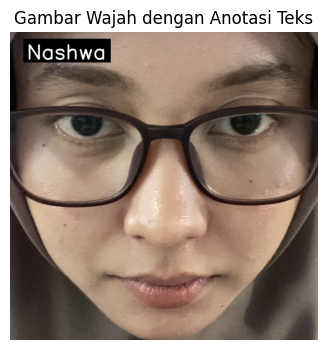

True

In [8]:
# Menambahkan anotasi teks pada gambar wajah dan background
def add_text_annotation(img, text, position=(50, 80)):
    img_copy = img.copy()
    
    # Menambahkan background hitam untuk teks agar lebih jelas
    cv2.rectangle(img_copy, (position[0]-10, position[1]-60), 
                  (position[0]+250, position[1]+10), (0, 0, 0), -1)
    
    # Menambahkan teks
    cv2.putText(img_copy, text, position, 
                cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), 3, cv2.LINE_AA)
    
    return img_copy

# Tambahkan nama pada crop wajah
img1_face_annotated = add_text_annotation(img1_face_resized, "Nashwa")

# Menampilkan gambar dengan anotasi teks
plt.figure(figsize=(4, 4))
plt.imshow(img1_face_annotated)
plt.title('Gambar Wajah dengan Anotasi Teks')
plt.axis('off')
plt.grid(True, alpha=0.3)
plt.show()

# Menyimpan gambar hasil crop wajah dengan anotasi teks
cv2.imwrite('results_ws4/soal1_wajah_annotated.png', cv2.cvtColor(img1_face_annotated, cv2.COLOR_RGB2BGR))

#### 1.6 Penjelasan:

1. Efek Cropping
    - adalah proses memotong area tertentu dari gambar untuk fokuspada bagian ROI
    - Crop wajah -> memotong dan mengambil area wajah dari gambar asli
    - Crop latar belakang -> memotong dan mengambil are latar dari gambar asli
    - Resize 920x920 -> mengubah ukuran gambar menjadi 920x920 piksel

2. Efek Perubahan Warna
    - cv2 secara default memiliki format warna BGR
    - untuk bisa terlihat seperti normalnya di mata manusia, gambar diubah ke forma warna RGB
    - warna grayscale hanya menampilkan warna hitam dan putih, informasi warna menjadi hilang
    - HSV dapat menampilkan Hue, Saturasi, dan Kecerahan/Value

---

### **Soal 2 — Manipulasi Channel Warna RGB**

* Gunakan gambar hasil crop dari Soal 1.
* Konversikan gambar ke ruang warna **RGB**.
* Lakukan manipulasi channel warna dengan cara:

  * **Naikkan intensitas channel merah sebanyak 50 poin** (maksimum 255).
  * **Turunkan intensitas channel biru sebanyak 30 poin** (minimum 0).
* Teknik atau cara menaikkan/menurunkan intensitas **dibebaskan**, asalkan logis dan hasilnya terlihat.
* Gabungkan kembali channel warna dan **simpan gambar hasil modifikasi dalam format `.png`**.
* **Tampilkan histogram per channel (R, G, B)** untuk gambar asli dan hasil modifikasi menggunakan `matplotlib.pyplot.hist`.
* Jelaskan dampak perubahan RGB pada warna gambar dalam sel **Markdown**.


#### 2.1 Memuat dan Mengonversi ke RGB Gambar yang Akan Digunakan (Hasil Crop dari Soal-1)

In [9]:
# Menggunakan gambar hasil crop wajah dari Soal-1
img2_path = os.path.join(os.getcwd(), 'results_ws4', 'soal1_wajah.png')

# Mengonversi gambar BGR ke RGB
img2_bgr = cv2.imread(img2_path)
img2_rgb = cv2.cvtColor(img2_bgr, cv2.COLOR_BGR2RGB)

#### 2.2 Manipulasi Channel Warna

In [10]:
# Memisahkan channel RGB
r_channel = img2_rgb[:, :, 0].astype(np.float32)
g_channel = img2_rgb[:, :, 1].astype(np.float32)
b_channel = img2_rgb[:, :, 2].astype(np.float32)

print("Channel asli:")
print(f"  Red   - Min: {r_channel.min():.1f}, Max: {r_channel.max():.1f}, Mean: {r_channel.mean():.1f}")
print(f"  Green - Min: {g_channel.min():.1f}, Max: {g_channel.max():.1f}, Mean: {g_channel.mean():.1f}")
print(f"  Blue  - Min: {b_channel.min():.1f}, Max: {b_channel.max():.1f}, Mean: {b_channel.mean():.1f}")


# Manipulasi channel warna
# Menaikkan intensitas channel merah +50 (maksimum 255)
r_channel_modified = np.clip(r_channel + 50, 0, 255)

# Menurunkan intensitas channel biru -30 (minimum 0)
b_channel_modified = np.clip(b_channel - 30, 0, 255)

# Channel hijau tetap
g_channel_modified = g_channel

print("\nChannel setelah modifikasi:")
print(f"  Red   - Min: {r_channel_modified.min():.1f}, Max: {r_channel_modified.max():.1f}, Mean: {r_channel_modified.mean():.1f}")
print(f"  Green - Min: {g_channel_modified.min():.1f}, Max: {g_channel_modified.max():.1f}, Mean: {g_channel_modified.mean():.1f}")
print(f"  Blue  - Min: {b_channel_modified.min():.1f}, Max: {b_channel_modified.max():.1f}, Mean: {b_channel_modified.mean():.1f}")

# Menggabungkan kembali channel
img2_modified = np.stack([r_channel_modified, g_channel_modified, b_channel_modified], axis=2).astype(np.uint8)

# Menyimpan gambar hasil modifikasi
cv2.imwrite('results_ws4/soal2_modified.png', cv2.cvtColor(img2_modified, cv2.COLOR_RGB2BGR))

Channel asli:
  Red   - Min: 0.0, Max: 255.0, Mean: 132.9
  Green - Min: 0.0, Max: 250.0, Mean: 110.4
  Blue  - Min: 0.0, Max: 231.0, Mean: 95.7

Channel setelah modifikasi:
  Red   - Min: 50.0, Max: 255.0, Mean: 181.9
  Green - Min: 0.0, Max: 250.0, Mean: 110.4
  Blue  - Min: 0.0, Max: 201.0, Mean: 66.4


True

#### 2.3 Menampilkan Histogram Per Channel (R, G, B)

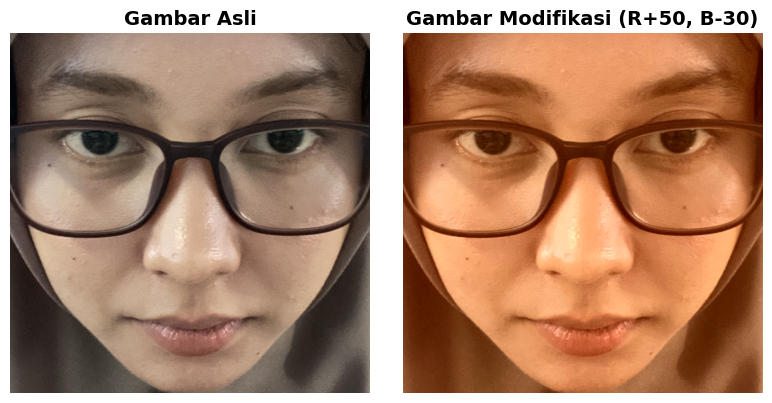

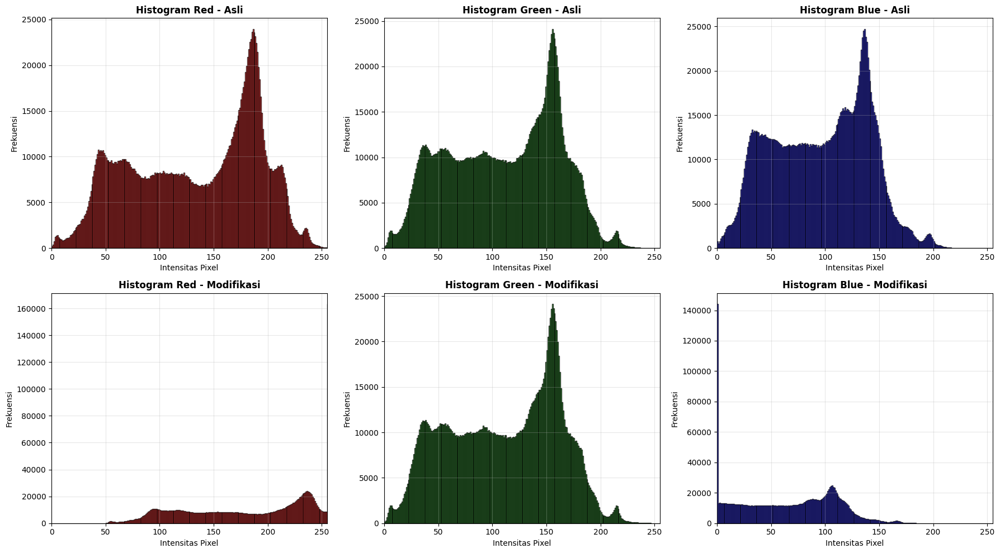

In [11]:
# Menampilkan histogram per channel untuk gambar asli dan hasil modifikasi
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].imshow(img2_rgb)
axes[0].set_title('Gambar Asli', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img2_modified)
axes[1].set_title('Gambar Modifikasi (R+50, B-30)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('results_ws4/soal2_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# Histogram
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

colors = ['red', 'green', 'blue']
channel_names = ['Red', 'Green', 'Blue']

# Histogram gambar asli
for i in range(3):
    axes[0, i].hist(img2_rgb[:, :, i].ravel(), bins=256, range=(0, 256), 
                    color=colors[i], alpha=0.7, edgecolor='black')
    axes[0, i].set_title(f'Histogram {channel_names[i]} - Asli', fontweight='bold')
    axes[0, i].set_xlabel('Intensitas Pixel')
    axes[0, i].set_ylabel('Frekuensi')
    axes[0, i].grid(True, alpha=0.3)
    axes[0, i].set_xlim([0, 255])

# Histogram gambar modifikasi
for i in range(3):
    axes[1, i].hist(img2_modified[:, :, i].ravel(), bins=256, range=(0, 256), 
                    color=colors[i], alpha=0.7, edgecolor='black')
    axes[1, i].set_title(f'Histogram {channel_names[i]} - Modifikasi', fontweight='bold')
    axes[1, i].set_xlabel('Intensitas Pixel')
    axes[1, i].set_ylabel('Frekuensi')
    axes[1, i].grid(True, alpha=0.3)
    axes[1, i].set_xlim([0, 255])

plt.tight_layout()
plt.savefig('results_ws4/soal2_histogram.png', dpi=150, bbox_inches='tight')
plt.show()

#### 2.4 Penjelasan:

Dampak manipulasi RGB gambar:
- dengan menaikkan pixel pada channel warna merah +50, gambar menjadi lebih kemerahan
- dengan menurunkan pixel pada channel biru -30, tone biru menjadi berkurang, dan kesan warnanya menjadi lebih hangat
- kurva pada histogram channel warna merah bergeser ke kanan karena lebih banyak piksel dengan intensitas tinggi
- kurva pada histogram channel warna biru bergeser ke kiri karena intensitas piksel menjadi lebih rendah

---

### **Soal 3 — Deteksi Tepi dan Filter Citra**

* Ambil gambar **objek dengan background bertekstur** (misalnya kain bermotif, jerami, atau batu).
* Terapkan **edge detection (Canny)** dan tampilkan hasilnya.
* Lakukan **thresholding dengan nilai ambang tertentu** (bebas Anda tentukan) agar hanya objek utama yang tersisa.
* Buat **bounding box** di sekitar objek hasil segmentasi (boleh manual atau otomatis).
* Terapkan **filter blur** dan **filter sharpening**, lalu **bandingkan hasil keduanya**.
* Jelaskan bagaimana setiap filter memengaruhi detail gambar dalam format **Markdown**.


#### 3.1 Memuat dan Menampilkan Gambar

Ukuran gambar: (1272, 1316, 3)


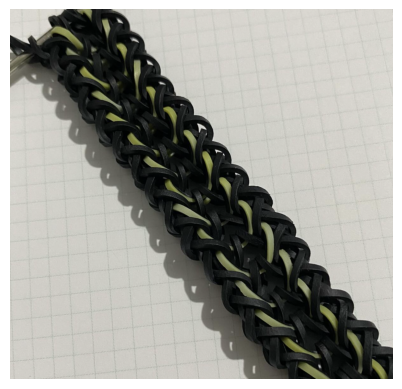

In [12]:
img3_path = os.path.join(os.getcwd(), 'assets_ws4', 'object.png')
img3 = cv2.imread(img3_path)

print(f"Ukuran gambar: {img3.shape}")

img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
plt.imshow(img3_rgb)
plt.axis('off')
plt.show()

#### 3.2 Penerapan Edge Detection dengan Canny

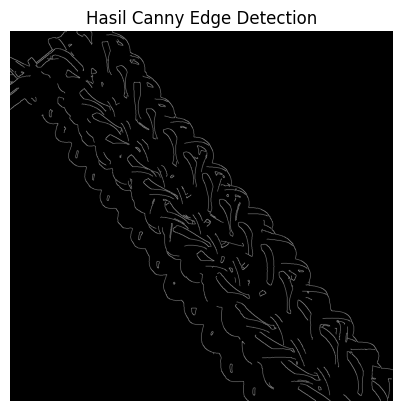

True

In [13]:
# Mengonversi gambar ke grayscale
img3_gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

# Menggunakan Gaussian Blur untuk mengurangi noise sebelum edge detection
img3_blur = cv2.GaussianBlur(img3_gray, (5, 5), 0)

# Canny Edge Detection
edges = cv2.Canny(img3_blur, 50, 150)

# Menampilkan hasil Canny Edge Detection
plt.imshow(edges, cmap='gray')
plt.title('Hasil Canny Edge Detection')
plt.axis('off')
plt.show()

# Menyimpan hasil Canny Edge Detection
cv2.imwrite('results_ws4/soal3_canny_edges.png', edges)

#### 3.3 Melakukan Thresholding

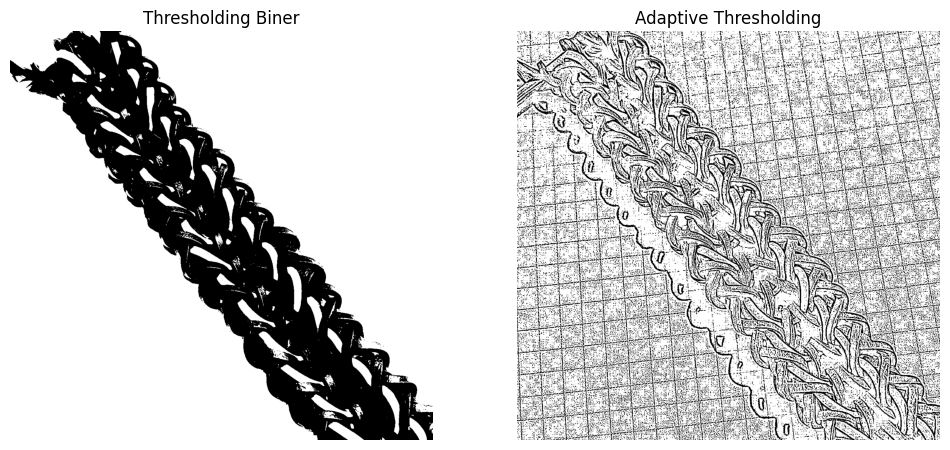

<Figure size 640x480 with 0 Axes>

In [14]:
# Melakukan thresholding dengan nilai = 50
threshold_value = 50
_, img3_threshold = cv2.threshold(img3_gray, threshold_value, 255, cv2.THRESH_BINARY)

# Menggunakan adaptive thresholding untuk hasil lebih baik
img3_adaptive_thresh = cv2.adaptiveThreshold(img3_gray, 255, 
                                             cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                             cv2.THRESH_BINARY, 11, 2)

# Menampilkan hasil thresholding
fig, axs = plt.subplots(1, 2, figsize=(12, 8))
axs[0].imshow(img3_threshold, cmap='gray')
axs[0].set_title('Thresholding Biner')
axs[0].axis('off')
axs[1].imshow(img3_adaptive_thresh, cmap='gray')
axs[1].set_title('Adaptive Thresholding')
axs[1].axis('off')
plt.show()

# Menyimpan hasil thresholding
plt.savefig('results_ws4/soal3_thresholding.png', dpi=150, bbox_inches='tight')

#### 3.4 Membuat Bounding Box di Sekitar Objek

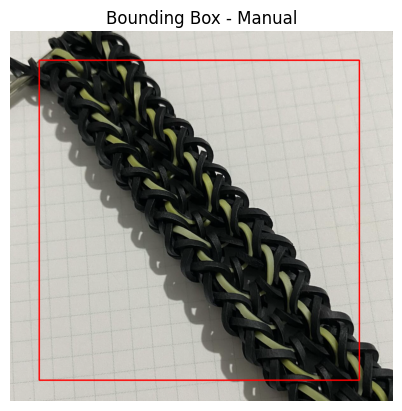

True

In [15]:
# Membuat bounding box di sekitar objek hasil segmentasi secara manual

# Menggambar bounding box menggunakan Pascal VOC format
img3_bounding_box = img3_rgb.copy()
start_point = (100, 100)  # Titik kiri atas (x1, y1)
end_point = (1200, 1200)  # Titik kanan bawah (x2, y2)
color = (255, 0, 0)     # Warna bounding box (merah)
thickness = 3           # Ketebalan garis bounding box
cv2.rectangle(img3_bounding_box, start_point, end_point, color, thickness)

# Menmpilkan gambar
plt.imshow(img3_bounding_box)
plt.title('Bounding Box - Manual')
plt.axis('off')
plt.show()

# Menyimpan gambar dengan bounding box
cv2.imwrite('results_ws4/soal3_bounding_box_manual.png', cv2.cvtColor(img3_bounding_box, cv2.COLOR_RGB2BGR))

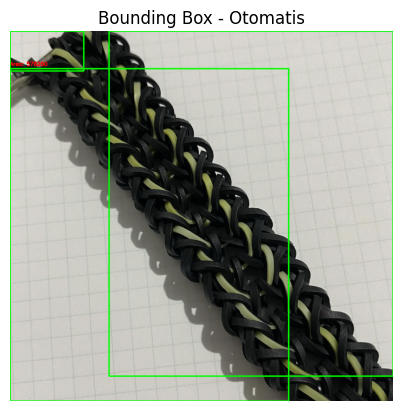

True

In [ ]:
# Membuat bounding box di sekitar objek hasil segmentasi secara otomatis

img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# Mencari contours dari hasil threshold
contours, _ = cv2.findContours(img3_threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Membuat copy untuk menggambar bounding box
img3_bbox = img3_rgb.copy()

# Menggambar bounding box untuk setiap contour yang cukup besar
min_area = 3500  # Area minimum untuk memfilter noise
for contour in contours:
    area = cv2.contourArea(contour)
    if area > min_area:
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(img3_bbox, (x, y), (x+w, y+h), (0, 255, 0), 3)
        # Tambahkan teks area
        cv2.putText(img3_bbox, f'Area: {int(area)}', (x, y-10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        
plt.imshow(img3_bbox)
plt.title('Bounding Box - Otomatis')
plt.axis('off')
plt.show()

# Menyimpan gambar dengan bounding box otomatis
cv2.imwrite('results_ws4/soal3_bounding_box_automatic.png', cv2.cvtColor(img3_bbox, cv2.COLOR_RGB2BGR))

#### 3.5 Penerapan Filter Blur dan Sharpening

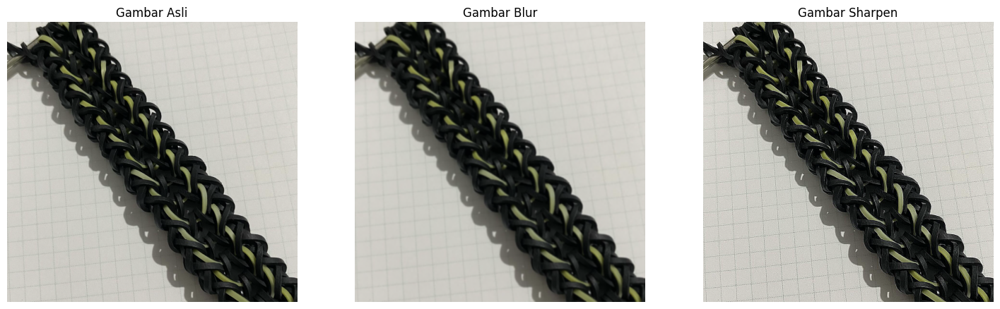

<Figure size 640x480 with 0 Axes>

In [17]:
# Menerapkan filter blur dan filter sharpen pada gambar
img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# Filter Blur (Menggunakan Gaussian Blur)
img3_blur = cv2.GaussianBlur(img3_rgb, (15, 15), 0)

# Filter Sharpen
kernel_sharpen = np.array([[-1, -1, -1],
                           [-1,  9, -1],
                           [-1, -1, -1]])
img3_sharpen = cv2.filter2D(img3_rgb, -1, kernel_sharpen)

# Menampilkan hasil filter blur dan sharpen
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
axs[0].imshow(img3_rgb)
axs[0].set_title('Gambar Asli')
axs[0].axis('off')
axs[1].imshow(img3_blur)
axs[1].set_title('Gambar Blur')
axs[1].axis('off')
axs[2].imshow(img3_sharpen)
axs[2].set_title('Gambar Sharpen')
axs[2].axis('off')
plt.show()

# Menyimpan hasil filter blur dan sharpen
plt.savefig('results_ws4/soal3_blur_sharpen.png', dpi=150, bbox_inches='tight')

#### 3.6 Penjelasan:

1. Edge detection dengan Canny
    - Canny mendeteksi perubahan intensitas yang tajam dalam gambar (kontras antara 2 atau lebih warna), contohnya seperti gambar yang saya gunakan, terdapat perubahan intensitas yang tajam antara object (hitam) dan latarnya (putih)
    - Canny menggunakan gradien untuk menemukan area dengan perubahan signifikasn
    - gambar setelah diberlakukan Canny menjadi hitam dan memiliki garis-garis putih yang menunjukkan edge yang terdeteksi dengan threshold tertentu
2. Thresholding
    - untuk Binary thresholding, gambar diubah menjadi hitam-putih (binary)
    - sedangkan Adaptive thresholding, menghitung threshold berbeda untuk setiap regionnya
3. Bounding box
    - secara manual, bbox dapat diatur sesuai keinginan untuk menandai objek yang diinginkan, tetapi sulit mendapatkan koordinat pastinya
    - secara otomatis, gambar akan mendeteksi contour dari gambar hasil threshold kemudian bbox akan menandai lokasi objek dalam gambar
4. Blur
    - mengurangi noise dan detail halus, gambar menjadi leboh smooth
5. Sharpening
    - edges dan tekstur pada gambar menjadi lebih tajam dan jelas meskipun dapat memperkuat noise

---

### **Soal 4 — Deteksi Wajah dan Filter Digital Kreatif**

* Ambil gambar diri Anda dengan ekspresi wajah **netral**.
* Lakukan **deteksi wajah dan landmark** menggunakan salah satu dari:

  * **MediaPipe**, atau
  * **Dlib**, atau
  * **OpenCV**.
* Buat **overlay filter digital kreatif** karya Anda sendiri, misalnya:

  * topi, kumis, masker, helm, aksesoris, atau bentuk unik lainnya.
  * Filter boleh dibuat dari **gambar eksternal (PNG)** *atau* digambar langsung (misal bentuk lingkaran, garis, poligon, dll).
* Pastikan posisi overlay menyesuaikan **landmark wajah** dengan logis.
* **Gunakan alpha blending sebagai saran** agar hasil tampak lebih natural.
* Tampilkan perbandingan antara **gambar asli** dan **hasil dengan filter**.
* Jelaskan bagaimana Anda menghitung posisi overlay dan tantangan yang dihadapi selama implementasi (gunakan **Markdown**).

In [18]:
img4 = cv2.imread(img1_path)
img4_rgb = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

#### 4.1 Mendeteksi Wajah dan Landmark Menggunakan MediaPipe

I0000 00:00:1763292658.495163  582411 gl_context.cc:357] GL version: 2.1 (2.1 Metal - 90.5), renderer: Apple M3
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1763292658.509836  603796 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1763292658.514990  603796 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
/Users/nashwalaisya/multimedia-uv-py312/lib/python3.12/site-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


Jumlah wajah terdeteksi: 1
Jumlah landmark per wajah: 478


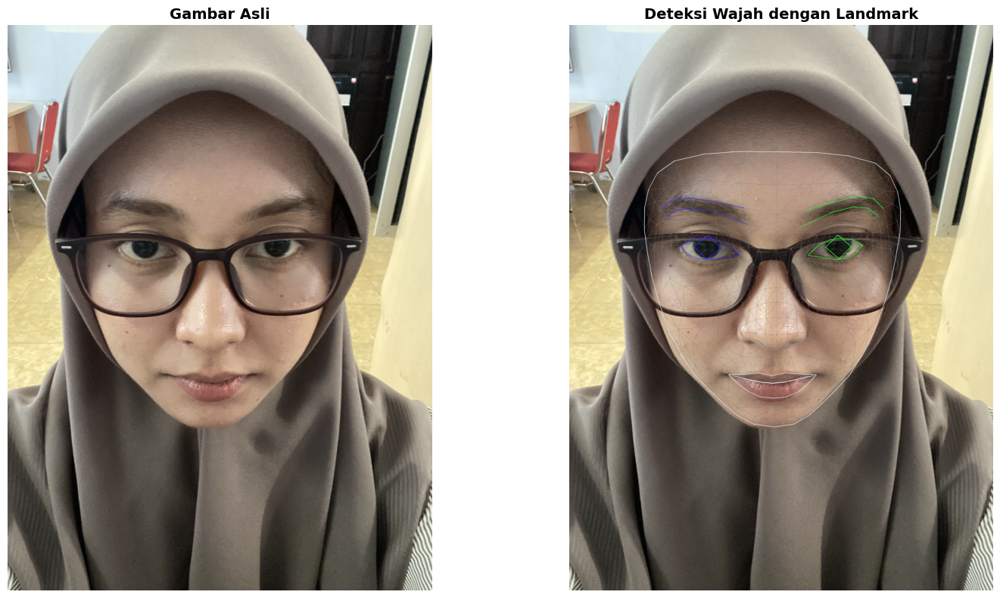

In [19]:
# Mendeteksi wajah dan landmark menggunakan MediaPipe

# Inisialisasi MediaPipe Face Mesh
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Membuat Face Mesh detector
face_mesh = mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    refine_landmarks=True,
    min_detection_confidence=0.5
)

# Memroses gambar
results = face_mesh.process(img4_rgb)

# Membuat copy gambar untuk menggambar landmark
img4_with_landmarks = img4_rgb.copy()

# Cek apakah wajah terdeteksi
if results.multi_face_landmarks:
    print(f"Jumlah wajah terdeteksi: {len(results.multi_face_landmarks)}")
    
    for face_landmarks in results.multi_face_landmarks:
        # Gambar mesh wajah lengkap
        mp_drawing.draw_landmarks(
            image=img4_with_landmarks,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_TESSELATION,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style()
        )
        
        # Gambar contour wajah
        mp_drawing.draw_landmarks(
            image=img4_with_landmarks,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_CONTOURS,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_contours_style()
        )
        
        # Gambar mata (iris)
        mp_drawing.draw_landmarks(
            image=img4_with_landmarks,
            landmark_list=face_landmarks,
            connections=mp_face_mesh.FACEMESH_IRISES,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_iris_connections_style()
        )
        
        print(f"Jumlah landmark per wajah: {len(face_landmarks.landmark)}")
else:
    print("Tidak ada wajah yang terdeteksi!")

# Menampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(img4_rgb)
axes[0].set_title('Gambar Asli', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img4_with_landmarks)
axes[1].set_title('Deteksi Wajah dengan Landmark', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('results_ws4/soal4_face_detection.png', dpi=150, bbox_inches='tight')
plt.show()

# Tutup face mesh
face_mesh.close()

#### 4.2 Membuat Overlay Filter Digital Kreatif

Ukuran filter: (1024, 1024, 4)
Channel: 4 (RGBA)


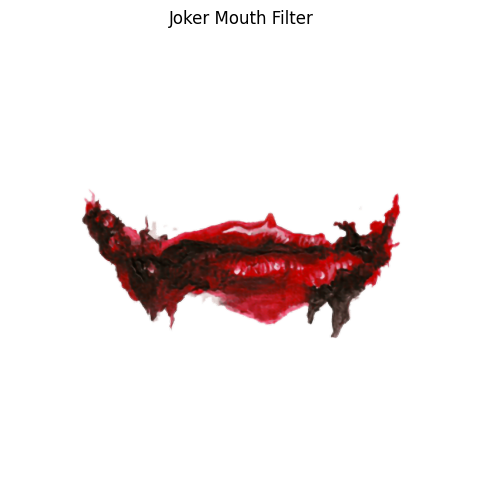

In [20]:
# Membaca joker mouth filter
joker_filter_path = os.path.join(os.getcwd(), 'assets_ws4', 'joker_filter.png')
joker_filter = cv2.imread(joker_filter_path, cv2.IMREAD_UNCHANGED)

# Konversi BGR ke RGB
if joker_filter.shape[2] == 4:
    # Ada alpha channel (BGRA)
    joker_rgb = cv2.cvtColor(joker_filter[:, :, :3], cv2.COLOR_BGR2RGB)
    joker_alpha = joker_filter[:, :, 3]
    joker_filter = np.dstack([joker_rgb, joker_alpha])
elif joker_filter.shape[2] == 3:
    joker_filter = cv2.cvtColor(joker_filter, cv2.COLOR_BGR2RGB)

print(f"Ukuran filter: {joker_filter.shape}")
print(f"Channel: {joker_filter.shape[2]} ({'RGBA' if joker_filter.shape[2] == 4 else 'RGB'})")

plt.figure(figsize=(6, 6))
plt.imshow(joker_filter)
plt.title('Joker Mouth Filter')
plt.axis('off')
plt.show()

In [21]:
# Fungsi helper untuk konversi landmark ke koordinat pixel
def get_landmark_coords(landmark, img_width, img_height):
    x = int(landmark.x * img_width)
    y = int(landmark.y * img_height)
    return (x, y)

# Ambil dimensi gambar
h, w, _ = img4_rgb.shape

if results.multi_face_landmarks:
    # Ambil landmark wajah pertama
    face_landmarks = results.multi_face_landmarks[0]
    
    # Ekstrak koordinat landmark mulut
    mouth_left = get_landmark_coords(face_landmarks.landmark[61], w, h)   # Sudut kiri mulut
    mouth_right = get_landmark_coords(face_landmarks.landmark[291], w, h)  # Sudut kanan mulut
    mouth_top = get_landmark_coords(face_landmarks.landmark[13], w, h)     # Atas mulut
    mouth_bottom = get_landmark_coords(face_landmarks.landmark[14], w, h)  # Bawah mulut
    
    print("✓ Koordinat landmark mulut berhasil diekstrak")
    print(f"  Mulut Kiri: {mouth_left}")
    print(f"  Mulut Kanan: {mouth_right}")
    print(f"  Mulut Atas: {mouth_top}")
    print(f"  Mulut Bawah: {mouth_bottom}")

✓ Koordinat landmark mulut berhasil diekstrak
  Mulut Kiri: (870, 1908)
  Mulut Kanan: (1350, 1909)
  Mulut Atas: (1111, 1955)
  Mulut Bawah: (1112, 1957)


✓ Filter joker berhasil diterapkan
  Posisi: (250, 1135) sampai (1888, 2773)
  Ukuran filter: 1638 x 1638 piksel


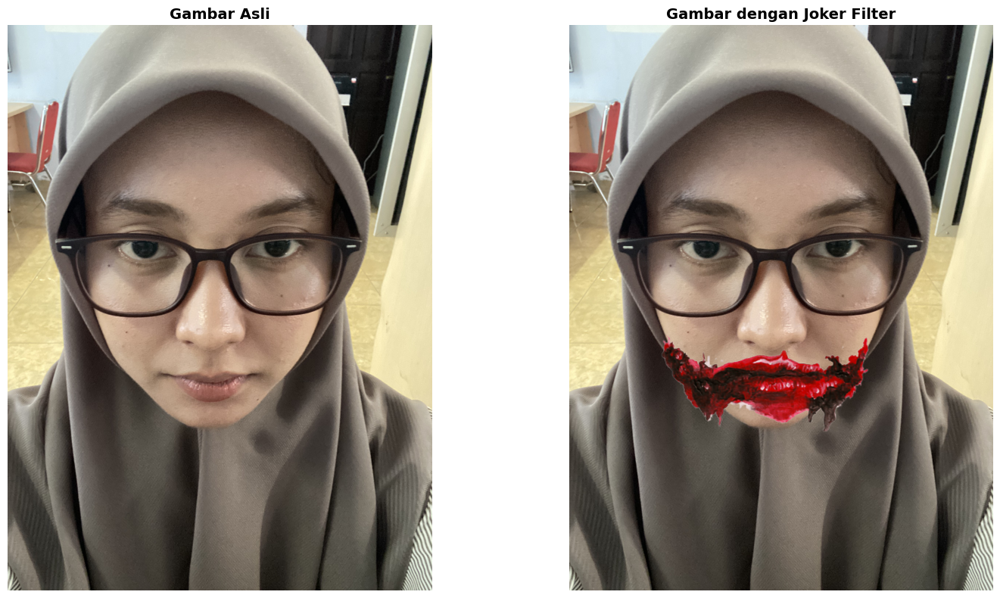

In [22]:
# Mengaplikasikan filter dengan koordinat

# Membuat copy gambar untuk overlay
img4_joker = img4_rgb.copy()

# Koordinat filter pada gambar wajah
filter_left_x = 250
filter_right_x = 1274
filter_y = 1135

# Menggunakan ukuran asli filter dan perbesar 1.5x
joker_height, joker_width = joker_filter.shape[:2]
scale_factor = 1.6
joker_height_scaled = int(joker_height * scale_factor)
joker_width_scaled = int(joker_width * scale_factor)

# Resize filter ke ukuran 1.7x
joker_filter_scaled = cv2.resize(joker_filter, (joker_width_scaled, joker_height_scaled), 
                                  interpolation=cv2.INTER_CUBIC)

# Menghitung posisi x agar filter berada di koordinat yang tepat
filter_x_position = filter_left_x
filter_y_position = filter_y

# Pastikan filter tidak keluar dari batas gambar
img_height, img_width = img4_rgb.shape[:2]

# Hitung area yang akan di-overlay
y1 = filter_y_position
y2 = min(filter_y_position + joker_height_scaled, img_height)
x1 = filter_x_position
x2 = min(filter_x_position + joker_width_scaled, img_width)

# Sesuaikan ukuran filter jika keluar batas
filter_h = y2 - y1
filter_w = x2 - x1

# Resize filter jika perlu (jika keluar batas)
if filter_h != joker_height_scaled or filter_w != joker_width_scaled:
    joker_resized = cv2.resize(joker_filter_scaled, (filter_w, filter_h), interpolation=cv2.INTER_AREA)
else:
    joker_resized = joker_filter_scaled

# Alpha blending
if joker_resized.shape[2] == 4:  # Ada alpha channel
    # Ekstrak RGB dan alpha
    joker_rgb_layer = joker_resized[:, :, :3]
    alpha_channel = joker_resized[:, :, 3] / 255.0
    
    # Ambil region of interest dari gambar asli
    roi = img4_joker[y1:y2, x1:x2]
    
    # Alpha blending: result = alpha * foreground + (1 - alpha) * background
    for c in range(3):
        roi[:, :, c] = (alpha_channel * joker_rgb_layer[:, :, c] + 
                        (1 - alpha_channel) * roi[:, :, c])
    
    # Terapkan hasil blending ke gambar
    img4_joker[y1:y2, x1:x2] = roi
else:
    # Tanpa alpha channel, langsung paste
    img4_joker[y1:y2, x1:x2] = joker_resized

print(f"✓ Filter joker berhasil diterapkan")
print(f"  Posisi: ({x1}, {y1}) sampai ({x2}, {y2})")
print(f"  Ukuran filter: {filter_w} x {filter_h} piksel")

# Menampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(img4_rgb)
axes[0].set_title('Gambar Asli', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img4_joker)
axes[1].set_title('Gambar dengan Joker Filter', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('results_ws4/soal4_joker_filter.png', dpi=150, bbox_inches='tight')
plt.show()


#### 4.3 Penjelasan:

1. Perhitungan posisi overlay
    - pertama-tama, saya harus mengetahui ukuran gambar filter yang akan saya gunakan
    - kemudian menghitung koordinat landmark mulut dengan mengubah nilai landmark menjadi koordinat piksel terlebih dahulu
    - setelah koordinat landmark mulut berhasil diekstrak, saya menjadikan koordinat-koordinat tersebut menjadi patokan saya untuk menempatkan gambar filter
    - dengan koordinat landmark mulut, saya menempatkan gambar filter yang diperbesar 1.6x ukuran aslinya (karena ukuran asli terlalu kecil)
    - setelahnya, saya hanya perlu adjust koordinat filter di gambar wajahnya sesuai dengan yang saya inginkan
2. Tantangan selama implementasi
    - untuk menentukan koordinat yang paling sesuai agak lama karena harus mencoba-coba terus


---

### **Soal 5 — Perspektif dan Peningkatan Kualitas Citra**

* Ambil gambar **objek datar** seperti karya tangan di kertas, tulisan di papan tulis, atau foto produk di meja dengan kondisi pencahayaan atau sudut yang tidak ideal.
* Lakukan **preprocessing** untuk memperbaiki tampilan agar lebih rapi dan jelas, dengan langkah-langkah:

  * Konversi ke **grayscale**.
  * **Koreksi perspektif (transformasi homografi)** menggunakan **4 titik manual** agar objek terlihat sejajar dan tidak terdistorsi.
  * Terapkan **thresholding adaptif atau Otsu** (pilih salah satu, dan jelaskan alasan pilihan Anda).
* Tampilkan **setiap tahap pemrosesan dalam satu grid** agar mudah dibandingkan.
* Jelaskan fungsi masing-masing tahap dan bagaimana teknik ini meningkatkan kualitas visual citra (gunakan **Markdown**).

#### 5.1 Memuat Gambar Objek Datar

In [23]:
# Memuat gambar
img5_path = os.path.join(os.getcwd(), 'assets_ws4', 'objek_datar.png')

img5 = cv2.imread(img5_path)

#### 5.2 Pre-processing untuk Memperbaiki Tampilan Gambar

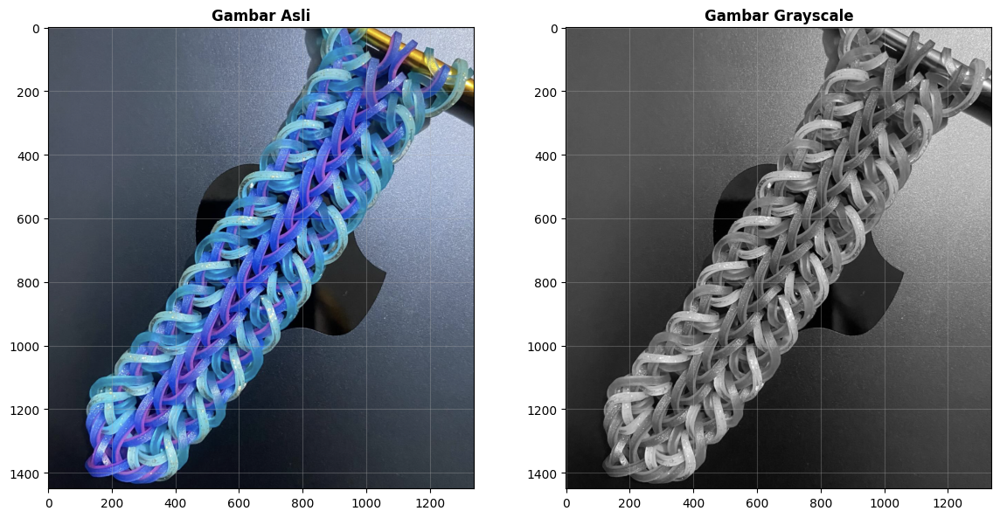

Ukuran gambar: (1450, 1338, 3)


<Figure size 640x480 with 0 Axes>

In [24]:
# Mengonversi Gambar ke Grayscale
img5_gray = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY)

# Menampilkan gambar asli dan grayscale
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(img5, cv2.COLOR_BGR2RGB))
axes[0].set_title('Gambar Asli', fontsize=12, fontweight='bold')
axes[0].axis('on')
axes[0].grid(True, alpha=0.3)

axes[1].imshow(img5_gray, cmap='gray')
axes[1].set_title('Gambar Grayscale', fontsize=12, fontweight='bold')
axes[1].axis('on')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Ukuran gambar: {img5.shape}")

# Menyimpan gambar asli dan grayscale
plt.savefig('results_ws4/soal5_original_grayscale.png', dpi=150, bbox_inches='tight')

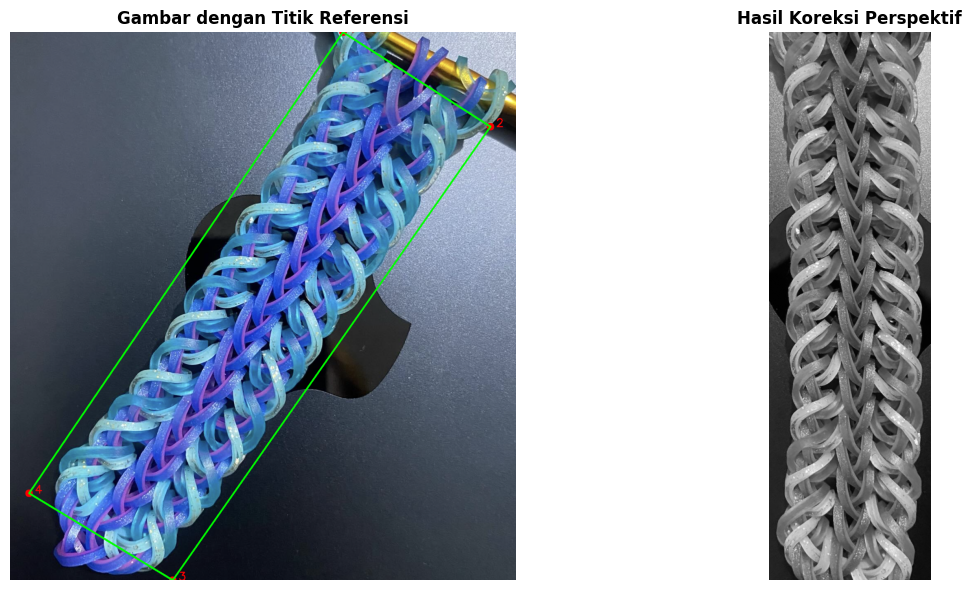

✓ Koreksi perspektif berhasil
  Dimensi output: 250 x 850 piksel


True

<Figure size 640x480 with 0 Axes>

In [25]:
# Koreksi Perspektif menggunakan 4 titik manual

# Mendefinisikan koordinat
pts_src = np.float32([
    [880, 0],   # Kiri atas
    [1270, 250],   # Kanan atas
    [430, 1450],   # Kanan bawah
    [50, 1220]    # Kiri bawah
])

# Menentukan dimensi output yang diinginkan
output_width = 250
output_height = 850

# Titik tujuan (persegi panjang sempurna)
pts_dst = np.float32([
    [0, 0],                           # Kiri atas
    [output_width, 0],                # Kanan atas
    [output_width, output_height],    # Kanan bawah
    [0, output_height]                # Kiri bawah
])

# Hitung matriks transformasi perspektif
matrix = cv2.getPerspectiveTransform(pts_src, pts_dst)

# Terapkan transformasi perspektif
img5_warped = cv2.warpPerspective(img5_gray, matrix, (output_width, output_height))

# Visualisasi: Gambar titik-titik pada gambar asli
img5_with_points = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB).copy()
for i, pt in enumerate(pts_src):
    cv2.circle(img5_with_points, (int(pt[0]), int(pt[1])), 10, (255, 0, 0), -1)
    cv2.putText(img5_with_points, str(i+1), (int(pt[0])+15, int(pt[1])), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

# Gambar polygon untuk menunjukkan area yang akan dikoreksi
pts = pts_src.astype(np.int32).reshape((-1, 1, 2))
cv2.polylines(img5_with_points, [pts], True, (0, 255, 0), 3)

# Menampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(img5_with_points)
axes[0].set_title('Gambar dengan Titik Referensi', fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img5_warped, cmap='gray')
axes[1].set_title('Hasil Koreksi Perspektif', fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"✓ Koreksi perspektif berhasil")
print(f"  Dimensi output: {output_width} x {output_height} piksel")

# Menyimpan hasil koreksi perspektif
plt.savefig('results_ws4/soal5_perspective_correction.png', dpi=150, bbox_inches='tight')
cv2.imwrite('results_ws4/soal5_warped.png', img5_warped)


Thresholding Otsu berhasil diterapkan
Nilai threshold optimal (Otsu): 100.00


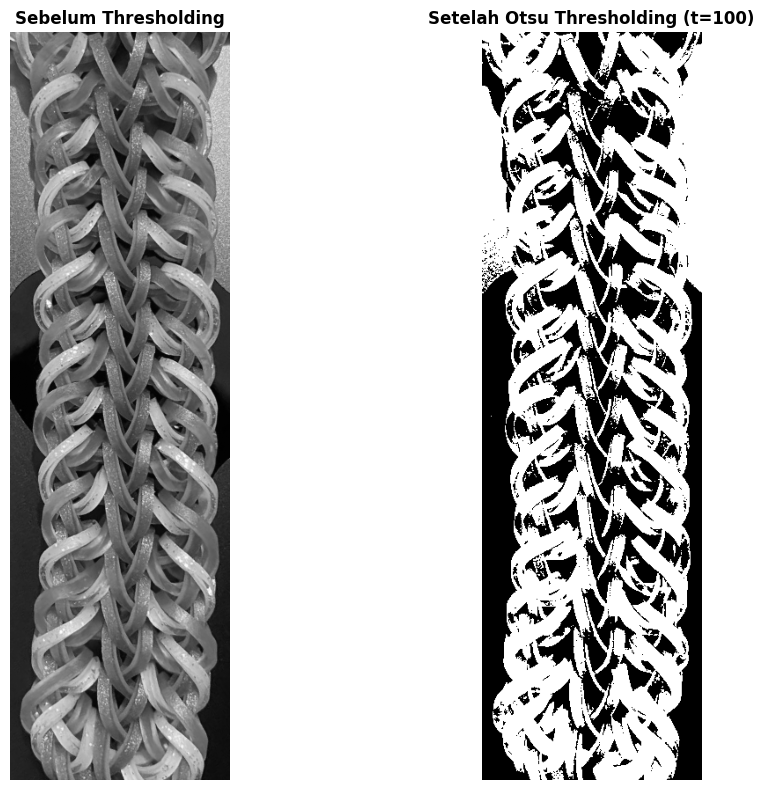

True

<Figure size 640x480 with 0 Axes>

In [26]:
# Menerapkan Thresholding Otsu
# Otsu's thresholding secara otomatis menentukan nilai threshold optimal

# Menerapkan Otsu Thresholding
ret_otsu, img5_otsu = cv2.threshold(img5_warped, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

print(f"Thresholding Otsu berhasil diterapkan")
print(f"Nilai threshold optimal (Otsu): {ret_otsu:.2f}")

# Menampilkan perbandingan
fig, axes = plt.subplots(1, 2, figsize=(12, 8))

axes[0].imshow(img5_warped, cmap='gray')
axes[0].set_title('Sebelum Thresholding', fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img5_otsu, cmap='gray')
axes[1].set_title(f"Setelah Otsu Thresholding (t={ret_otsu:.0f})", fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Menyimpan hasil Otsu Thresholding
plt.savefig('results_ws4/soal5_otsu_thresholding.png', dpi=150, bbox_inches='tight')
cv2.imwrite('results_ws4/soal5_otsu.png', img5_otsu)

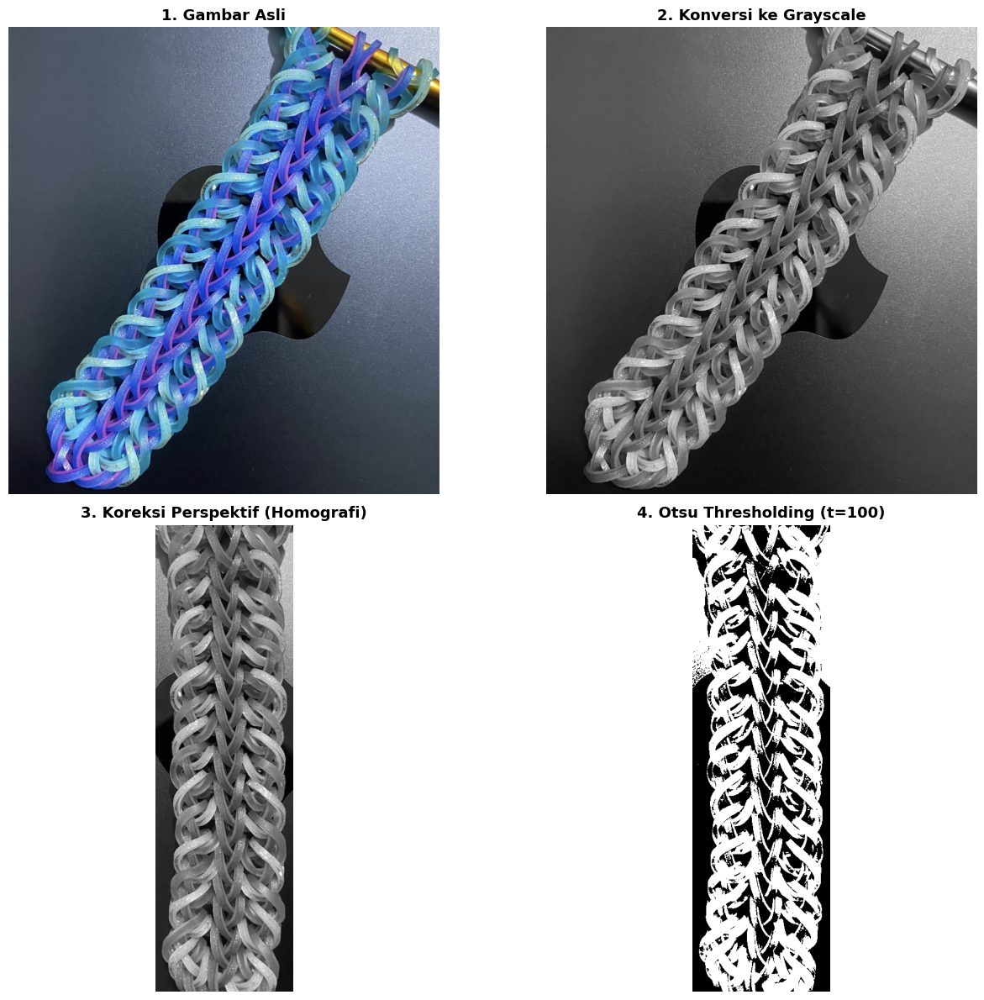

In [27]:
# Menampilkan semua tahap pemrosesan dalam satu grid
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# 1. Gambar Asli (RGB)
axes[0, 0].imshow(cv2.cvtColor(img5, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('1. Gambar Asli', fontsize=13, fontweight='bold')
axes[0, 0].axis('off')

# 2. Grayscale
axes[0, 1].imshow(img5_gray, cmap='gray')
axes[0, 1].set_title('2. Konversi ke Grayscale', fontsize=13, fontweight='bold')
axes[0, 1].axis('off')

# 3. Koreksi Perspektif
axes[1, 0].imshow(img5_warped, cmap='gray')
axes[1, 0].set_title('3. Koreksi Perspektif (Homografi)', fontsize=13, fontweight='bold')
axes[1, 0].axis('off')

# 4. Otsu Thresholding
axes[1, 1].imshow(img5_otsu, cmap='gray')
axes[1, 1].set_title(f'4. Otsu Thresholding (t={ret_otsu:.0f})', fontsize=13, fontweight='bold')
axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig('results_ws4/soal5_processing_stages.png', dpi=150, bbox_inches='tight')
plt.show()

#### 5.3 Penjelasan:

1. Fungsi tahapan proses
    - konversi ke grayscale -> untuk memudahkan pemrosesan gambar dan hanya fokus di informasi cerah-gelap saja
    - koreksi perspektif (transformasi homografi) -> untuk membuat objek datar terlihat tidak terdistorsi, seolah-olah difoto dari depan
    - thresholding Otsu -> untuk meningkatkan kontras, menghilangkan noise, dan membuat objek lebih jelas terbaca
        - alasan memilih Otsu -> threshold ditentukan secara otomatis tanpa perlu coba-coba manual
2. Kombinasi 3 teknik ini dapat meningkatkan kualitas visual citra dari gambar asli secara bertahap, dari yang memiliki sudut pandang miring dan pencahayaan tidak merata, menjadi rapi, sejajar, dan punya kontras tinggi yang mempermudah untuk dibaca atau dianalisis lebih lanjut

---

### **Aturan Umum Pengerjaan**

* Kerjakan secara **mandiri**.
* Bantuan AI (seperti ChatGPT, Copilot, dsb.) diperbolehkan **dengan bukti percakapan** (screenshot / link / script percakapan).
* Source code antar mahasiswa harus berbeda.
* Jika mendapat bantuan teman, tuliskan nama dan NIM teman yang membantu.
* Plagiarisme akan dikenakan sanksi sesuai aturan akademik ITERA.
* Cantumkan seluruh **credit dan referensi** yang digunakan di bagian akhir notebook.
* Penjelasan setiap soal ditulis dalam **Markdown**, bukan di dalam komentar kode.

---

### **Aturan Pengumpulan**

* Semua file kerja Anda (notebook `.ipynb`, gambar, dan hasil) **wajib diunggah ke GitHub repository tugas sebelumnya**.

  * Gunakan struktur folder berikut di dalam repo Anda:

    ```
    /Nama_NIM_Repo/ # Nama repo sebelumnya
      ├── assets_ws4/     # berisi semua gambar atau video asli (input)
      ├── results_ws4/    # berisi semua hasil modifikasi dan output
      ├── worksheet4.ipynb
      └── NIM_Worksheet4.pdf
    ```
* File yang dikumpulkan ke **Tally** hanya berupa **hasil PDF** dari notebook Anda, dengan format nama:

  ```
  NIM_Worksheet4.pdf
  ```
* Pastikan notebook telah dijalankan penuh sebelum diekspor ke PDF.
* Sertakan tautan ke repository GitHub Anda di bagian atas notebook atau di halaman pertama PDF.

---

### ✅ **Catatan Akhir**

> Worksheet 4 ini bertujuan mengasah pemahaman Anda tentang manipulasi citra digital secara praktis. Gunakan kreativitas Anda untuk menghasilkan hasil visual yang menarik dan penjelasan konseptual yang jelas.

---

### Credit & Referensi

- Joker Mouth Filter: https://www.citypng.com/photo/3876/realistic-joker-red-lips-mouth
- Claude.ai: https://claude.ai/share/2d0ba721-baac-4ddd-8b62-46c6a7a4e04f
- VSCode Copilot (percakapan saya lampirkan di bawah ini sebagai markdown):

---

**Prompt**: "help me to find the best threshold for canny edge detection"

I'll help you find the best threshold values for Canny edge detection by creating an interactive visualization that shows different threshold combinations. 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Perfect! I've added two new cells to help you find the best threshold values:

**First cell**: Tests 9 different threshold combinations in a grid view so you can visually compare them and choose which one captures the edges best for your image.

**Second cell**: Automatically calculates optimal thresholds based on the median intensity of your image using a common rule of thumb (0.66× and 1.33× median), then compares it with your manual settings.

Run these cells to:
1. See a grid of different threshold combinations
2. Get automatic threshold suggestions based on your image
3. Compare the results and pick the best one

After running, you can update your original Canny detection with the threshold values that work best for your loom image!

Made changes.

---

**Prompt:** "help me detect face(s) and landmarking with mediapipe"

I'll help you implement face detection and landmark detection using MediaPipe. Let me add the complete code: 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Now let me add a cell to show specific landmark points that are useful for adding filters: 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Now let me add a cell with a creative filter example: 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Now let me add a markdown cell explaining the implementation: 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Perfect! I've implemented a complete face detection and landmark tracking solution using MediaPipe with the following features:

**Cell 1** - Basic face detection:
- Detects face and draws all 468 facial landmarks
- Shows face mesh, contours, and iris
- Displays before/after comparison

**Cell 2** - Key landmark points:
- Highlights important landmarks for filter placement
- Shows landmark indices and labels
- Prints pixel coordinates for reference

**Cell 3** - Creative filter implementation:
- Draws **glasses** (kacamata) using circles and lines
- Draws **mustache** (kumis) using filled polygons
- Includes `overlay_transparent()` function for PNG overlays with alpha blending
- Automatically scales based on face size

**Cell 4** - Explanation:
- Documents the implementation approach
- Explains landmark selection and position calculations
- Lists challenges encountered

You can now run these cells to see the face detection and creative filter in action! The filter automatically adapts to the face size and position. You can also modify the drawing code to create your own custom filters (hats, masks, accessories, etc.).

Made changes.

---

**Prompt:** "bantu saya menambahkan filter joker ke gambar wajah dengan koordinat ujung kiri filter berada di koordinat 600,1956 (gambar wajah) dan ujung kanan 1624,1956. tetap gunakan ukuran asli gambar filter, sesuaikan posisinya saja sesuai dengan koordinat gambar wajah yang saya berikan"

Summarized conversation history
I'll help you add the joker filter to the face image using the specific coordinates you provided. Let me check the current notebook state first and then implement the solution. Optimizing tool selection...

Retrieving Notebook summary.

Now I'll implement the joker filter application using the specific coordinates you provided. I'll replace the current empty cell with the implementation. 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Now let me run the cell to apply the joker filter with your specified coordinates: 

Ran [](vscode-notebook-cell:/Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb#Y114sZmlsZQ%3D%3D)

Perfect! Filter joker berhasil diterapkan pada gambar wajah dengan koordinat yang Anda tentukan. Filter diposisikan dengan:
- Ujung kiri: koordinat (600, 1956)
- Ujung kanan: koordinat (1624, 1956)
- Ukuran filter tetap menggunakan ukuran asli (1024 x 1024 piksel)

Filter diterapkan menggunakan alpha blending sehingga tampak natural dengan transparansi yang tepat. Hasil perbandingan antara gambar asli dan gambar dengan filter joker telah ditampilkan dan disimpan di soal4_joker_filter.png.

Made changes.

---

**Prompt:** "bisa bantu saya mengerjakan ini:
Lakukan **preprocessing** untuk memperbaiki tampilan agar lebih rapi dan jelas, dengan langkah-langkah:

  * Konversi ke **grayscale**.
  * **Koreksi perspektif (transformasi homografi)** menggunakan **4 titik manual** agar objek terlihat sejajar dan tidak terdistorsi.
  * Terapkan **thresholding adaptif atau Otsu** (pilih salah satu)
* Tampilkan **setiap tahap pemrosesan dalam satu grid** agar mudah dibandingkan."

Saya akan membantu Anda mengerjakan Soal 5 dengan melakukan preprocessing untuk memperbaiki tampilan gambar objek datar. Mari kita mulai dengan melengkapi kode yang sudah ada. 

Using "Replace String in File"

Sekarang saya akan menambahkan cell untuk koreksi perspektif: 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Sekarang saya akan menambahkan cell untuk thresholding (saya akan menggunakan Otsu): 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Sekarang saya akan menambahkan cell untuk menampilkan semua tahap pemrosesan dalam satu grid: 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Sekarang mari kita tambahkan cell markdown untuk penjelasan: 

Edit [](file:///Users/nashwalaisya/Documents/Semester%20-%207/Sistem%20Teknologi%20Multimedia/Worksheet%204/worksheet4.ipynb)

Made changes.